##### Copyright 2019 The TensorFlow Authors.

Licensed under the Apache License, Version 2.0 (the "License");

In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# pix2pix: Image-to-image translation with a conditional GAN

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/pix2pix"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

## Import TensorFlow and other libraries

In [2]:
import tensorflow as tf
import numpy as np

import os
import pathlib
import time
import datetime
import rasterio

from matplotlib import pyplot as plt
from IPython import display

2025-05-07 21:14:50.570187: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-07 21:14:50.570224: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-07 21:14:50.571454: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-07 21:14:50.577003: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-07 21:14:51.139052: W tensorflow/compiler/tf2

## Load the dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Each original image is of size `5000 x 5000`

In [4]:
# install rasterio
!pip install rasterio

### Visualize data

In [ ]:
nbr_path = 'data/train/band/LC08_CU_002008_20200825_20210504_02_SR_NBR_norm.TIF'
mask_path = 'data/train/mask/LC08_CU_002008_20200825_20210504_02_BP.TIF'

target_size = 5000
target_width = 5000
# read nbr band
with rasterio.open(nbr_path) as src:
    # downsample by a factor of 5 because a 5000x5000 image can overwhelm matplotlib
    h, w = src.shape
    window = rasterio.windows.Window(0, 1000, target_size//2, target_size//2)
    nbr = src.read(1, window=window)

# read mask band
with rasterio.open(mask_path) as src:
    # downsample by a factor of 5 because a 5000x5000 image can overwhelm matplotlib
    h, w = src.shape
    window = rasterio.windows.Window(0, 1000, target_size//2, target_size//2)
    mask = src.read(1, window=window)

# Visualize
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.imshow(nbr, cmap='inferno')
plt.colorbar(label='Pixel Intensity')
plt.title(f"Downsampled nNBR Image {nbr.shape}" )

plt.subplot(1, 2, 2)
plt.imshow(mask, cmap='inferno')
plt.colorbar(label='Pixel Intensity')
plt.title(f"Downsampled BP Image {mask.shape}" )

plt.show()

You need to separate real building facade images from the architecture label images—all of which will be of size `256 x 256`.

Define a function that loads image files and outputs two image tensors:

In [6]:
def load(image_folder):

  # paths to the nbr and mask subfolders
  band_folder = os.path.join(image_folder, 'band')
  mask_folder = os.path.join(image_folder, 'mask')

  # list all the files in both folders, filtering out non-image files
  band_files = sorted([f for f in os.listdir(band_folder) if os.path.isfile(os.path.join(band_folder, f)) and not f.startswith('.')])
  mask_files = sorted([f for f in os.listdir(mask_folder) if os.path.isfile(os.path.join(mask_folder, f)) and not f.startswith('.')])

  # make sure the directories have the same number of files
  # check if both lists are the same length
  if len(band_files) == len(mask_files):
      # print corresponding pairs of files
      for band_file, mask_file in zip(band_files, mask_files):
          print(f"Band file: {band_file}, Mask file: {mask_file}")
  else:
      print("The number of band and mask files do not match.")

  paired_data = []

  target_size = 5000
  target_width = 5000
  # iterate over each pair of files from the band and mask directories
  for band_file, mask_file in zip(band_files, mask_files):
      band_path = os.path.join(band_folder, band_file)
      mask_path = os.path.join(mask_folder, mask_file)

      # open and read the band
      with rasterio.open(band_path) as src:
          h, w = src.shape
          window = rasterio.windows.Window(0, 0, target_size, target_size)
          band = src.read(1, window=window)

      # open and read the mask band
      with rasterio.open(mask_path) as src:
          h, w = src.shape
          window = rasterio.windows.Window(0, 0, target_size, target_size)
          mask = src.read(1, window=window)

      # add an additional channel dimension
      band = np.expand_dims(band, axis=-1)
      mask = np.expand_dims(mask, axis=-1)

      # convert both images to float32 tensors
      band_image = tf.cast(band, tf.float32)
      mask_image = tf.cast(mask, tf.float32)

      # append the paired images to the list
      paired_data.append((band_image, mask_image))

  return paired_data


In [7]:
paired_images = load('data2/train')

# accessing the first pair
# Example of accessing the first pair of images
band_image, mask_image = paired_images[0]
print("Band Image Shape:", band_image.shape)
print("Mask Image Shape:", mask_image.shape)
print("Data type:", band_image.dtype)

Band file: LC08_CU_002008_20200825_20210504_02_SR_NBR_norm.TIF, Mask file: LC08_CU_002008_20200825_20210504_02_BP.TIF
Band file: LC08_CU_002008_20201012_20210504_02_SR_NBR_norm.TIF, Mask file: LC08_CU_002008_20201012_20210504_02_BP.TIF


2025-05-07 21:14:54.824742: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:274] failed call to cuInit: CUDA_ERROR_SYSTEM_DRIVER_MISMATCH: system has unsupported display driver / cuda driver combination
2025-05-07 21:14:54.824768: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:129] retrieving CUDA diagnostic information for host: claude3
2025-05-07 21:14:54.824773: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:136] hostname: claude3
2025-05-07 21:14:54.824863: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:159] libcuda reported version is: 535.230.2
2025-05-07 21:14:54.824880: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:163] kernel reported version is: 550.120.0
2025-05-07 21:14:54.824884: E external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:244] kernel version 550.120.0 does not match DSO version 535.230.2 -- cannot find working devices in this configuration


Band Image Shape: (5000, 5000, 1)
Mask Image Shape: (5000, 5000, 1)
Data type: <dtype: 'float32'>


## Patchify the image
Since the image size is too big (**5000x5000**), we will patchify (break down) the original images into image pairs of size **256x256**

In [8]:
# break down the image
import tensorflow as tf


def patchify(image, patch_size):
    """
    Slices a large image into smaller non-overlapping patches.

    Args:
        image: A TensorFlow tensor of shape [height, width, channels].
        patch_size: The size of each patch (e.g., 256 for 256x256 patches).

    Returns:
        A tensor of shape [num_patches_y, num_patches_x, patch_size, patch_size, channels].
    """

    # check the shape before patching
    print("Image shape before patchifying:", image.shape)

    # use tensorflow's extract_patches to patchify
    patches = tf.image.extract_patches(
        images=tf.expand_dims(image, axis=0),  # add batch dimension
        sizes=[1, patch_size, patch_size, 1],
        strides=[1, patch_size, patch_size, 1],
        rates=[1, 1, 1, 1],
        padding='VALID'
    )
    # reshape to [num_patches_y, num_patches_x, patch_size, patch_size, channels]
    patch_shape = [tf.shape(patches)[1], tf.shape(patches)[2], patch_size, patch_size, tf.shape(image)[-1]]
    patches = tf.reshape(patches, patch_shape)
    return patches

In [9]:
# determine patch size
patch_size = 256

# Assuming input_image and real_image are [5000, 5000, channels]
input_patches = patchify(band_image, patch_size)
real_patches = patchify(mask_image, patch_size)

print("Input Patches Shape:", input_patches.shape)
print("Real Patches Shape:", real_patches.shape)

Image shape before patchifying: (5000, 5000, 1)
Image shape before patchifying: (5000, 5000, 1)
Input Patches Shape: (19, 19, 256, 256, 1)
Real Patches Shape: (19, 19, 256, 256, 1)


## Build an input pipeline 

Having checked that the loading and preprocessing works, let's define a couple of helper functions that load and preprocess the training and test sets:

In [10]:
# data folder
train_folder = 'data2/train'
test_folder = 'data2/test'

In [11]:
@tf.function()
def random_mirror(input_image, real_image):

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

**We also perform preprocessing like filtering clouds and waters as well as scaling here**

In [12]:
def load_image(image_folder, patch_size=256):

  paired_data = load(image_folder)
  paired_patches = []

  for nbr, mask in paired_data:
      nbr_tensor = tf.convert_to_tensor(nbr, dtype=tf.float32)
      mask_tensor = tf.convert_to_tensor(mask, dtype=tf.float32)
    
      # replace NaN values with 0 in nbr_tensor
      nbr_tensor = tf.where(tf.math.is_nan(nbr_tensor), tf.zeros_like(nbr_tensor), nbr_tensor)

      # replace NaN values with 0 in mask_tensor
      mask_tensor = tf.where(tf.math.is_nan(mask_tensor), tf.zeros_like(mask_tensor), mask_tensor)
    
      # filter the BP, setting every above 100 (mostly clouds and water) to 0
      mask_tensor = tf.where(mask_tensor > 100, 0, mask_tensor)

      # normalizing the values to [-1, 1]
      nbr_tensor = nbr_tensor / 127.5 - 1 
      mask_tensor = mask_tensor / 50 - 1
        

      # patchify the images
      nbr_patches = patchify(nbr_tensor, patch_size)
      mask_patches = patchify(mask_tensor, patch_size)

      # ensure the patches are paired correctly
      for i in range(nbr_patches.shape[0]):
          for j in range(nbr_patches.shape[1]):
              paired_patches.append((nbr_patches[i, j], mask_patches[i, j]))


  # create tensorFlow dataset
  dataset = tf.data.Dataset.from_generator(
      lambda: iter(paired_patches),
      output_signature=(
          tf.TensorSpec(shape=(patch_size, patch_size, 1), dtype=tf.float32),
          tf.TensorSpec(shape=(patch_size, patch_size, 1), dtype=tf.float32),
      )
  )

  return dataset

## Load the training set

In [13]:
# create the train dataset
train_dataset = load_image(train_folder)

Band file: LC08_CU_002008_20200825_20210504_02_SR_NBR_norm.TIF, Mask file: LC08_CU_002008_20200825_20210504_02_BP.TIF
Band file: LC08_CU_002008_20201012_20210504_02_SR_NBR_norm.TIF, Mask file: LC08_CU_002008_20201012_20210504_02_BP.TIF
Image shape before patchifying: (5000, 5000, 1)
Image shape before patchifying: (5000, 5000, 1)
Image shape before patchifying: (5000, 5000, 1)
Image shape before patchifying: (5000, 5000, 1)


In [14]:
# count the number of patches before data augmentation
patch_count = sum(1 for _ in train_dataset)
print("Number of patches before Data Augmentation:", patch_count)

Number of patches before Data Augmentation: 722


In [15]:
# apply random horizontal flipping
mirrored_dataset = train_dataset.map(random_mirror)

# concatenate to the original dataset
train_dataset = train_dataset.concatenate(mirrored_dataset)

## Define BUFFER_SIZE and BATCH_SIZE

In [16]:
# count the number of elements in the dataset
patch_count = sum(1 for _ in train_dataset)
print("Number of patches after Data Augmentation:", patch_count)

Number of patches after Data Augmentation: 1444


In [17]:
# declare buffer size and batch size
### BUFFER_SIZE will be the total number of patches
BUFFER_SIZE = patch_count
BATCH_SIZE = 1 # this one has been shown to be the optimal

In [18]:
# shuffle, batch, and prefetch for optimal performance
train_dataset = train_dataset.shuffle(buffer_size=BUFFER_SIZE).batch(batch_size=BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

## Visualize the training set

Patch 1:
nNBR patch shape: (1, 256, 256, 1)
Burn Probability patch shape: (1, 256, 256, 1)


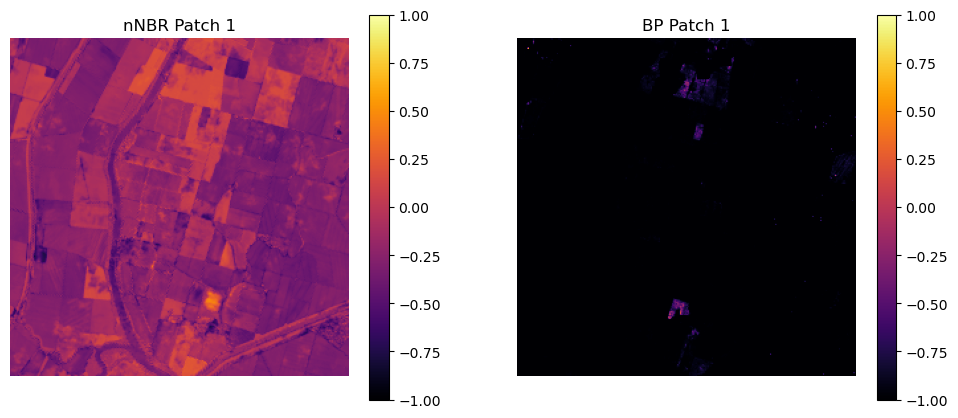

Patch 2:
nNBR patch shape: (1, 256, 256, 1)
Burn Probability patch shape: (1, 256, 256, 1)


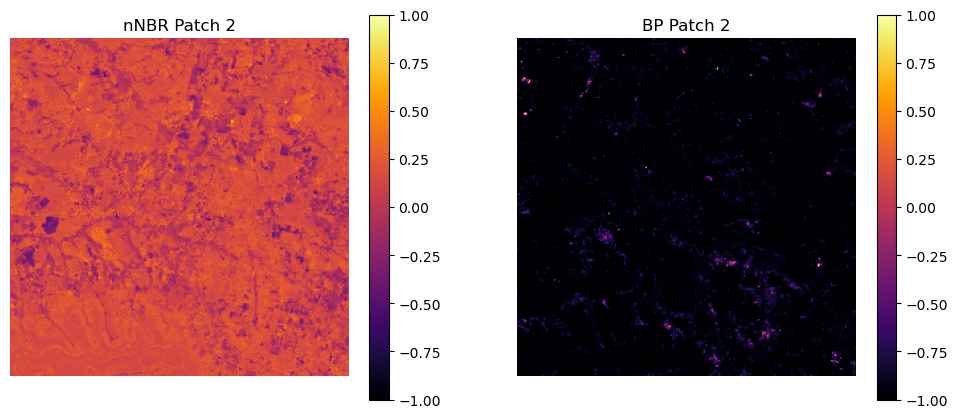

Patch 3:
nNBR patch shape: (1, 256, 256, 1)
Burn Probability patch shape: (1, 256, 256, 1)


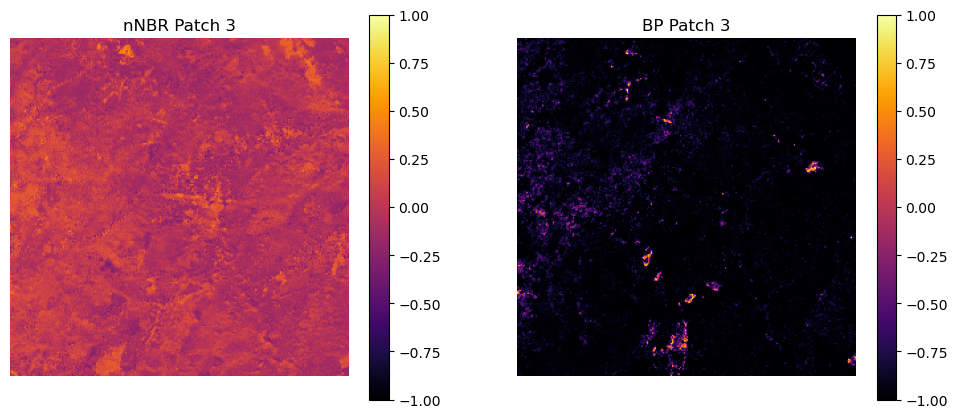

In [19]:
# Loop through the first 5 patches in the training dataset
for i, (nbr_patch, mask_patch) in enumerate(train_dataset.take(3)):
    print(f"Patch {i+1}:")
    print(f"nNBR patch shape: {nbr_patch.shape}")
    print(f"Burn Probability patch shape: {mask_patch.shape}")

    # convert tensors to numpy arrays for visualization if needed
    nbr_patch_np = nbr_patch.numpy()
    mask_patch_np = mask_patch.numpy()

    # plot the NBR patch and its corresponding mask patch
    plt.figure(figsize=(12, 5))

    # plot NBR patch
    plt.subplot(1, 2, 1)
    plt.imshow(nbr_patch_np[0, :, :, 0], cmap='inferno', vmin=-1, vmax=1)  # assuming single channel NBR
    plt.colorbar()
    plt.title(f'nNBR Patch {i+1}')
    plt.axis('off')

    # plot mask patch
    plt.subplot(1, 2, 2)
    plt.imshow(mask_patch_np[0, :, :, 0], cmap='inferno', vmin=-1, vmax=1)  # assuming single channel mask
    plt.colorbar()
    plt.title(f'BP Patch {i+1}')
    plt.axis('off')

    plt.show()

## Load test set

In [20]:
# Create the dataset
test_dataset = load_image(test_folder)

# Shuffle, batch, and prefetch for optimal performance
test_dataset = test_dataset.shuffle(buffer_size=BUFFER_SIZE).batch(batch_size=BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

Band file: LC08_CU_002008_20201028_20210504_02_SR_NBR_norm.TIF, Mask file: LC08_CU_002008_20201028_20210504_02_BP.TIF
Image shape before patchifying: (5000, 5000, 1)
Image shape before patchifying: (5000, 5000, 1)


Patch 1:
NBR patch shape: (1, 256, 256, 1)
Burn Probability patch shape: (1, 256, 256, 1)


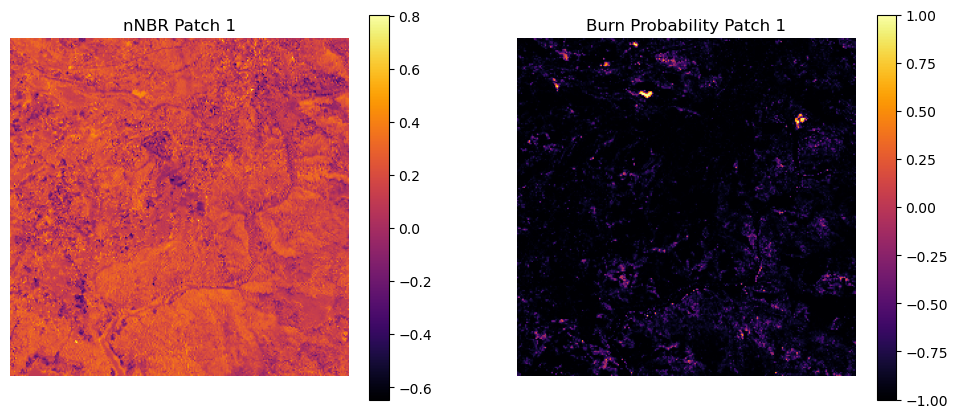

Patch 2:
NBR patch shape: (1, 256, 256, 1)
Burn Probability patch shape: (1, 256, 256, 1)


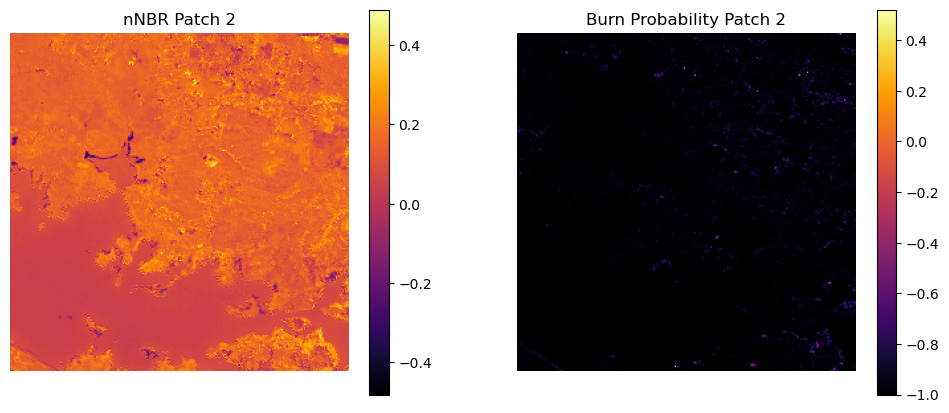

Patch 3:
NBR patch shape: (1, 256, 256, 1)
Burn Probability patch shape: (1, 256, 256, 1)


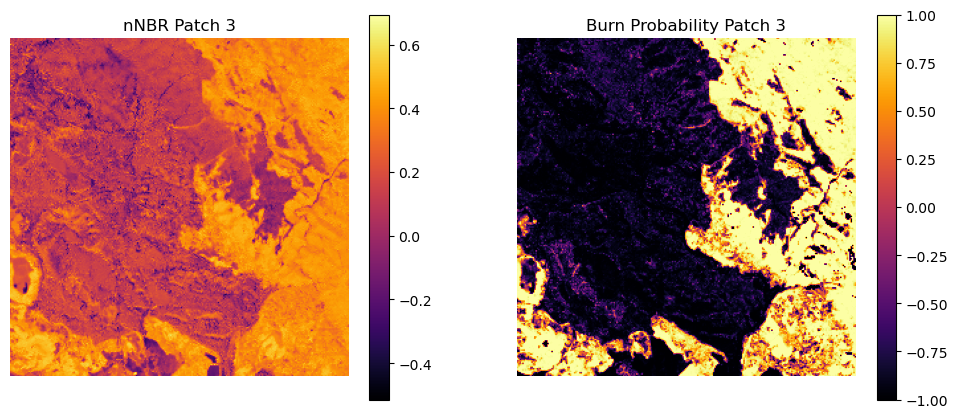

In [21]:
# Loop through the first 5 patches in the training dataset
for i, (nbr_patch, mask_patch) in enumerate(test_dataset.take(3)):
    print(f"Patch {i+1}:")
    print(f"NBR patch shape: {nbr_patch.shape}")
    print(f"Burn Probability patch shape: {mask_patch.shape}")

    # Convert tensors to numpy arrays for visualization if needed
    nbr_patch_np = nbr_patch.numpy()
    mask_patch_np = mask_patch.numpy()

    # Plot the NBR patch and its corresponding mask patch
    plt.figure(figsize=(12, 5))

    # Plot NBR patch
    plt.subplot(1, 2, 1)
    plt.imshow(nbr_patch_np[0, :, :, 0], cmap='inferno')  # Assuming single channel NBR
    plt.colorbar()
    plt.title(f'nNBR Patch {i+1}')
    plt.axis('off')

    # Plot mask patch
    plt.subplot(1, 2, 2)
    plt.imshow(mask_patch_np[0, :, :, 0], cmap='inferno')  # Assuming single channel mask
    plt.colorbar()
    plt.title(f'Burn Probability Patch {i+1}')
    plt.axis('off')

    plt.show()

## Build the generator

The generator of your pix2pix cGAN is a _modified_ [U-Net](https://arxiv.org/abs/1505.04597). A U-Net consists of an encoder (downsampler) and decoder (upsampler). (You can find out more about it in the [Image segmentation](../images/segmentation.ipynb) tutorial and on the [U-Net project website](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/).)

- Each block in the encoder is: Convolution -> Batch normalization -> Leaky ReLU
- Each block in the decoder is: Transposed convolution -> Batch normalization -> Dropout (applied to the first 3 blocks) -> ReLU
- There are skip connections between the encoder and decoder (as in the U-Net).

Define the downsampler (encoder):

In [22]:
# Output channels
OUTPUT_CHANNELS = 1

In [23]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

### Get a single patch

In [24]:
# get a single patch
single_patch = next(iter(train_dataset))

# unpack the NBR and mask patches
nbr_patch, mask_patch = single_patch

In [25]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(nbr_patch[0], 0))
print (down_result.shape)

(1, 128, 128, 3)


Define the upsampler (decoder):

In [26]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [27]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


Define the generator with the downsampler and the upsampler:

In [28]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 1])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  # using tanh() as the last layer of generator output
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Visualize the generator model architecture:

In [29]:
generator = Generator()
# tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Test the generator:

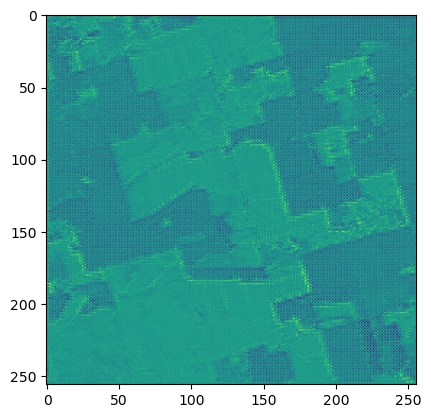

In [30]:
import random

gen_output = generator(nbr_patch[...], training=False)
plt.imshow(gen_output[0, ...,0])# take the entire first generated output

### Define the generator loss

GANs learn a loss that adapts to the data, while cGANs learn a structured loss that penalizes a possible structure that differs from the network output and the target image, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004).

- The generator loss is a sigmoid cross-entropy loss of the generated images and an **array of ones**.
- The pix2pix paper also mentions the L1 loss, which is a MAE (mean absolute error) between the generated image and the target image.
- This allows the generated image to become structurally similar to the target image.
- The formula to calculate the total generator loss is `gan_loss + LAMBDA * l1_loss`, where `LAMBDA = 100`. This value was decided by the authors of the paper.

In [31]:
LAMBDA = 100

In [32]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [33]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

The training procedure for the generator is as follows:

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)


## Build the discriminator

The discriminator in the pix2pix cGAN is a convolutional PatchGAN classifier—it tries to classify if each image _patch_ is real or not real, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004).

- Each block in the discriminator is: Convolution -> Batch normalization -> Leaky ReLU.
- The shape of the output after the last layer is `(batch_size, 30, 30, 1)`.
- Each `30 x 30` image patch of the output classifies a `70 x 70` portion of the input image.
- The discriminator receives 2 inputs:
    - The input image and the target image, which it should classify as real.
    - The input image and the generated image (the output of the generator), which it should classify as fake.
    - Use `tf.concat([inp, tar], axis=-1)` to concatenate these 2 inputs together.

Let's define the discriminator:

In [34]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

Visualize the discriminator model architecture:

In [35]:
discriminator = Discriminator()
# tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

Test the discriminator:

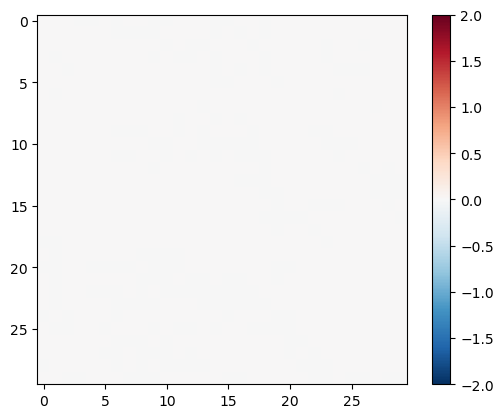

In [36]:
disc_out = discriminator([nbr_patch[...], gen_output], training=False)
plt.imshow(disc_out[0, ...,-1], vmin=-2, vmax=2, cmap='RdBu_r')
plt.colorbar()

### Define the discriminator loss

- The `discriminator_loss` function takes 2 inputs: **real images** and **generated images**.
- `real_loss` is a sigmoid cross-entropy loss of the **real images** and an **array of ones(since these are the real images)**.
- `generated_loss` is a sigmoid cross-entropy loss of the **generated images** and an **array of zeros (since these are the fake images)**.
- The `total_loss` is the sum of `real_loss` and `generated_loss`.

In [37]:
def discriminator_loss(disc_real_output, disc_generated_output):

  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

The training procedure for the discriminator is shown below.

To learn more about the architecture and the hyperparameters you can refer to the [pix2pix paper](https://arxiv.org/abs/1611.07004).

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


## Define the optimizers and a checkpoint-saver


In [38]:
# Adam for both discriminator and generator
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5) ### failed

In [39]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Generate images

Write a function to plot some images during training.

- Pass images from the test set to the generator.
- The generator will then translate the input image into the output.
- The last step is to plot the predictions and _voila_!
- Add an **error map** to the visualization to get a better sense of the performance

Note: The `training=True` is intentional here since you want the batch statistics, while running the model on the test dataset. If you use `training=False`, you get the accumulated statistics learned from the training dataset (which you don't want).

In [40]:
import imageio

def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(20, 10))
  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input - Normalized NBR', 'Ground Truth - Burn Probability', 'Map - Predicted BP']


  for i in range(3):
    plt.subplot(1, 4, i+1)
    plt.title(title[i])
    # getting the pixel values in the [0, 1] range to plot.
    plt.imshow(np.squeeze(display_list[i]), cmap='inferno')
    plt.colorbar(shrink=0.4)
    # comparing
    plt.axis('on')
  
  # display mse map as an error map
  error_value = np.mean(np.squeeze(tar[0]) - np.squeeze(prediction[0]))
  error_map = np.squeeze(tar[0]) - np.squeeze(prediction[0])

  plt.subplot(1, 4, 4)
  plt.title(f'Map - Error: {error_value:.4f}')
  plt.imshow(error_map, cmap='coolwarm')
  plt.colorbar(shrink=0.4)
  plt.show()

     

Test the function:

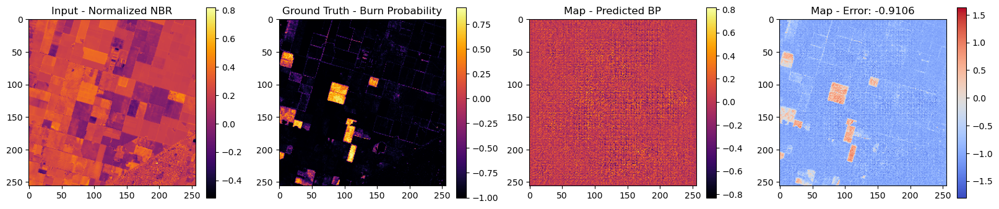

In [41]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

## Training

- For each example input generates an output.
- The discriminator receives the `input_image` and the generated image as the first input. The second input is the `input_image` and the `target_image`.
- Next, calculate the generator and the discriminator loss.
- Then, calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.
- Finally, log the losses to TensorBoard.

In [42]:
log_dir="logs/"
save_dir='saved_model/'

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [43]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
  # print the losses
#   if (step+1) % 100 == 0:
#     tf.print("Step:", step, "Gen Total Loss:", gen_total_loss, "Gen L1 Loss:", 
#              gen_l1_loss, "Gen GAN Loss:", gen_gan_loss, "Disc Loss:", disc_loss)
    
  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)
    
  return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

The actual training loop. Since this tutorial can run of more than one dataset, and the datasets vary greatly in size the training loop is setup to work in steps instead of epochs.

- Iterates over the number of steps.
- Every 10 steps print a dot (`.`).
- Every 1k steps: clear the display and run `generate_images` to show the progress.
- Every 5k steps: save a checkpoint.

In [44]:
def plot_losses(gen_total_losses, gen_gan_losses, gen_l1_losses, disc_losses):
    """Ploting each metric on a separate plot"""
    losses = [
        (gen_total_losses, "Generator Total Loss"),
        (gen_gan_losses, "Generator GAN Loss"),
        (gen_l1_losses, "Generator L1 Loss"),
        (disc_losses, "Discriminator Loss"),
    ]
    # color for each plot
    color = ['red', 'blue', 'orange', 'purple']
    
    plt.figure(figsize=(12,9))
    for i, (loss_data, loss_name) in enumerate(losses):
        plt.subplot(2, 2, i + 1)
        plt.plot(loss_data, label=loss_name, color=color[i])
        plt.xlabel('Steps')
        plt.ylabel('Loss')
        plt.title(f'{loss_name} over Time')  # use f-string for title
        plt.legend()
        plt.grid(True)
    plt.tight_layout()
    plt.show()    

In [45]:
from IPython.display import clear_output

def fit(train_ds, test_ds, steps):

  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()
  gen_total_losses = [] 
  gen_gan_losses = []
  gen_l1_losses = []
  disc_losses = []

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss = train_step(input_image, target, step)
    
    # Save losses for later visualization
    gen_total_losses.append(gen_total_loss)
    gen_gan_losses.append(gen_gan_loss)
    gen_l1_losses.append(gen_l1_loss)
    disc_losses.append(disc_loss)
    
    # track failures early
    # D loss goes to 0 -> failed
    if disc_loss == 0:
        print('Training Procedure failed :((')
        break

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)

    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)
    
  plot_losses(gen_total_losses, gen_gan_losses, gen_l1_losses, disc_losses)

This training loop saves logs that you can view in TensorBoard to monitor the training progress.

If you work on a local machine, you would launch a separate TensorBoard process. When working in a notebook, launch the viewer before starting the training to monitor with TensorBoard.

Launch the TensorBoard viewer (Sorry, this doesn't
display on tensorflow.org):

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

You can view the [results of a previous run](https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw) of this notebook on [TensorBoard.dev](https://tensorboard.dev/).

Finally, run the training loop:

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

Interpreting the logs is more subtle when training a GAN (or a cGAN like pix2pix) compared to a simple classification or regression model. Things to look for:

- Check that neither the generator nor the discriminator model has "won". If either the `gen_gan_loss` or the `disc_loss` gets very low, it's an indicator that this model is dominating the other, and you are not successfully training the combined model.
- The value `log(2) = 0.69` is a good reference point for these losses, as it indicates a perplexity of 2 - the discriminator is, on average, equally uncertain about the two options.
- For the `disc_loss`, a value below `0.69` means the discriminator is doing better than random on the combined set of real and generated images.
- For the `gen_gan_loss`, a value below `0.69` means the generator is doing better than random at fooling the discriminator.
- As training progresses, the `gen_l1_loss` should go down.

## Restore the latest checkpoint and test the network

In [48]:
!ls {checkpoint_dir}

checkpoint		    ckpt-5.data-00000-of-00001
ckpt-1.data-00000-of-00001  ckpt-5.index
ckpt-1.index		    ckpt-6.data-00000-of-00001
ckpt-2.data-00000-of-00001  ckpt-6.index
ckpt-2.index		    ckpt-7.data-00000-of-00001
ckpt-3.data-00000-of-00001  ckpt-7.index
ckpt-3.index		    ckpt-8.data-00000-of-00001
ckpt-4.data-00000-of-00001  ckpt-8.index
ckpt-4.index


In [49]:
# restoring the latest checkpoint in checkpoint_dir
# checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Generate some images using the test set

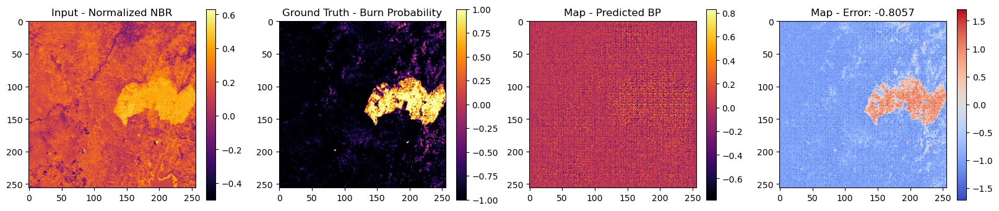

In [50]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(1):
  generate_images(generator, inp, tar)

## Save the model

In [51]:
import logging

# suppress warnings 
tf.get_logger().setLevel(logging.ERROR)

## Load the model

In [52]:
my_generator = tf.keras.models.load_model('saved_model/generator_2.h5')

## Generate prediction

In [53]:
test_palisades_folder = "data2/test_palisades"
palisades_dataset = load_image(test_palisades_folder)
palisades_dataset = palisades_dataset.shuffle(buffer_size=BUFFER_SIZE).batch(batch_size=BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

Band file: LC08_CU_003012_20250223_20250307_02_SR_NBR_norm.TIF, Mask file: LC08_CU_003012_20250223_20250307_02_BP.TIF
Band file: LC09_CU_003012_20250215_20250222_02_SR_NBR_norm.TIF, Mask file: LC09_CU_003012_20250215_20250222_02_BP.TIF
Image shape before patchifying: (5000, 5000, 1)
Image shape before patchifying: (5000, 5000, 1)
Image shape before patchifying: (5000, 5000, 1)
Image shape before patchifying: (5000, 5000, 1)


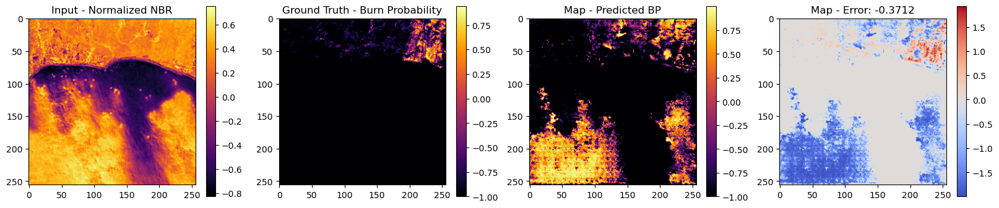

In [54]:
for inp, tar in palisades_dataset.take(1):
  generate_images(my_generator, inp, tar)

### Prediction Pipeline

Load input + ground truth -> Break images down to 256 x 256 -> Run images through the model -> Stack predicted images in an array -> Reassemble to original size

In [67]:
### TEST SCENE: PALISADES-CALIFORNIA
# load input data + ground truth data
test_palisades_folder = "data2/test_palisades_single"
test_augcomp_folder = "data2/test"

palisades = load_image(test_palisades_folder)
augcomp = load_image(test_augcomp_folder)

Band file: LC09_CU_003012_20250215_20250222_02_SR_NBR_norm.TIF, Mask file: LC09_CU_003012_20250215_20250222_02_BP.TIF
Image shape before patchifying: (5000, 5000, 1)
Image shape before patchifying: (5000, 5000, 1)
Band file: LC08_CU_002008_20201028_20210504_02_SR_NBR_norm.TIF, Mask file: LC08_CU_002008_20201028_20210504_02_BP.TIF
Image shape before patchifying: (5000, 5000, 1)
Image shape before patchifying: (5000, 5000, 1)


In [68]:
# number of images/patches
patch_count = sum(1 for _ in palisades)
patch_count

361

In [69]:
def generate_prediction(model, dataset, patch_count):
  # input array
  input_arr = []
  # prediction array
  prediction = []
  # convert into list
  dataset = list(dataset)
  # loop through the dataset and predict each 256x256
  for inp, tar in dataset:
      # adjust input dimension to propagate through the model
      inp = np.expand_dims(inp, axis=-1) # (256, 256, 1) add channel dimension
      inp = np.expand_dims(inp, axis=0) 
      # predict the input
      pred = model(inp, training=True)
      input_arr.append(inp)
      prediction.append(pred)
      
  return input_arr, prediction

### Test the model on the Palisades and AUGUST Complex wildfires

In [70]:
palisades_inp, palisades_pred = generate_prediction(my_generator, palisades, patch_count)
augcomp_inp, augcomp_pred = generate_prediction(my_generator, augcomp, patch_count)

In [71]:
def assemble(prediction, patch_size, num_rows, num_cols):
    # initialize empty array with shape 5000x5000x1
    assembled_img = np.zeros((num_rows * patch_size, num_cols * patch_size, 1))

    # loop through each predicted images and put it back to its original place
    for idx, patch in enumerate(prediction):
        # convert idx into corresponding row and column in the 2D grid image
        '''The logic here is, given a list of images (1D), the first 19 imgs (idx 0 to 18) will be in the first row
        and the next 19 images will be in the second row, row changes every 19 indices, so get the row of each img by 
        dividing by the number of cols. get the column by modding by the total number of cols
        '''
        row = idx // num_cols
        col = idx % num_cols

        # expand dimension 
        # patch = np.expand_dims(patch, axis=-1)

        # assemble the image
        assembled_img[
            row * patch_size : (row + 1) * patch_size,
            col * patch_size : (col + 1) * patch_size,
            :
        ] = patch

    return assembled_img

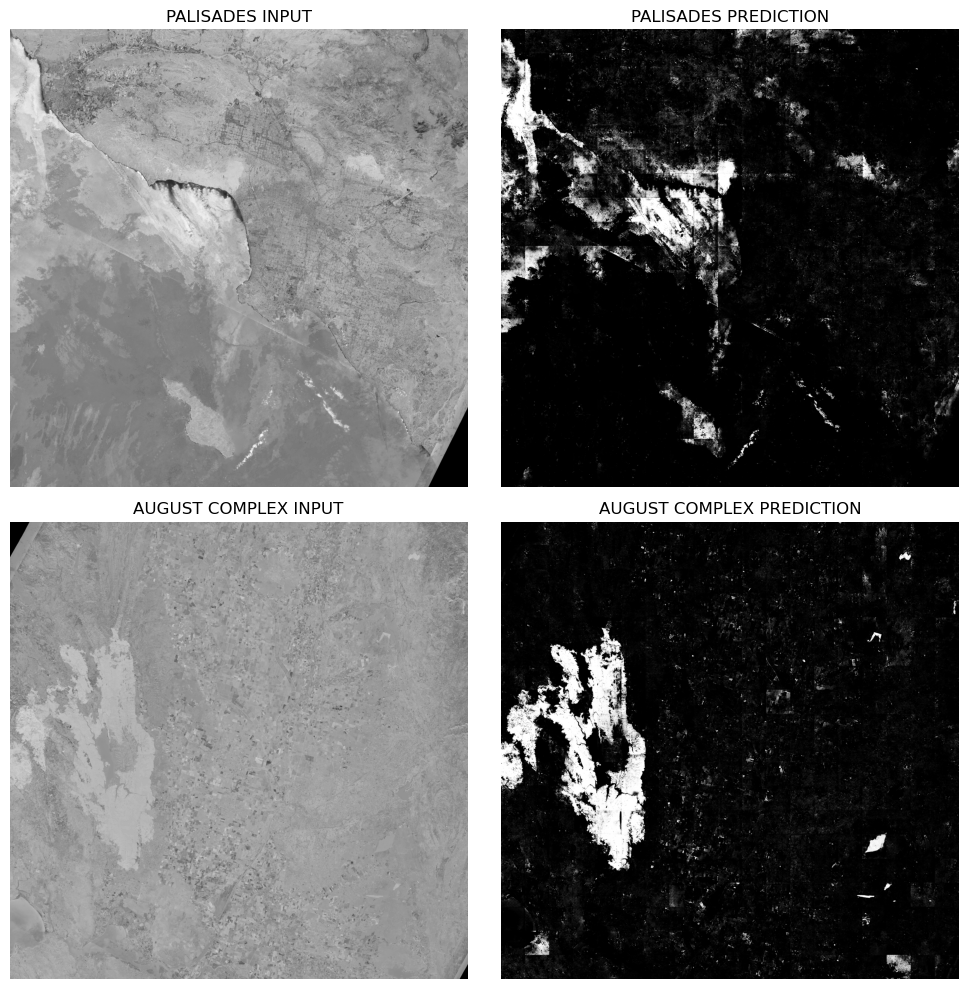

In [84]:
# image = assemble(pred, 256, 19, 19)
# assemble
palisades_inp_img = assemble(np.squeeze(palisades_inp,axis=-1), 256, 19, 19)
palisades_pred_img = assemble(palisades_pred, 256, 19, 19)
augcomp_inp_img = assemble(np.squeeze(augcomp_inp, axis=-1), 256, 19, 19)
augcomp_pred_img = assemble(augcomp_pred, 256, 19, 19)

images = [palisades_inp_img, palisades_pred_img, augcomp_inp_img, augcomp_pred_img]
scenes = ["PALISADES INPUT", "PALISADES PREDICTION","AUGUST COMPLEX INPUT", "AUGUST COMPLEX PREDICTION"]

# 2 rows 2 columns
fig, axes = plt.subplots(2, 2, figsize=(10,10))

for i, ax in enumerate(axes.flat):
    ax.imshow(np.squeeze(images[i], axis=-1), cmap='gray')  # Note: 'gray', not 'grey'
    ax.axis('off')
    ax.set_title(scenes[i])

plt.tight_layout()
plt.show()


In [86]:
# save image
from PIL import Image

titles = ["palisades_input","palisades_pred", "augustcomp_input", "augustcomp_pred"]

for i, image in enumerate(images):
    # convert from [-1,1] to [0,255]
    image = ((image - image.min()) * (1/(image.max() - image.min()) * 100)).astype('uint8')
    # remove singleton dimension as imwrite expects a 2D array for grayscale images
    image = np.squeeze(image, axis=-1)
    # save the image
    imageio.imwrite(f'{titles[i]}.png', image)